In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


#Importing libraries

In [2]:
import os
import shutil
import random
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
import tensorflow as tf
import cv2
import seaborn as sns
import pickle
import json

#Data Preparation

##Roboflow Dataset manually labeled

In [ ]:
# shutil.rmtree('/content/DEfDO-3')

In [ ]:
!pip install roboflow --quiet

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.9/79.9 kB 6.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.8/66.8 kB 4.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.5/54.5 kB 3.9 MB/s eta 0:00:00


In [ ]:
from roboflow import Roboflow
rf = Roboflow(api_key="xxGULUboEznOQ9JG9dDc")
project = rf.workspace("defdo").project("defdo")
version = project.version(6)
dataset = version.download("yolov8-obb")


loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to DEfDO-6 in yolov8-obb:: 100%|██████████| 4030/4030 [00:01<00:00, 4005.02it/s]


In [ ]:
import os
len(os.listdir('DEfDO-6/train/labels'))

1821

##Structuring the dataset format for YOLO

In [ ]:
# os.makedirs('my_dataset_v2')

# os.makedirs('my_dataset_v2/images')
# os.makedirs('my_dataset_v2/labels')

os.makedirs('my_dataset_v2/images/train')
os.makedirs('my_dataset_v2/images/val')
os.makedirs('my_dataset_v2/images/test')

os.makedirs('my_dataset_v2/labels/train')
os.makedirs('my_dataset_v2/labels/val')
os.makedirs('my_dataset_v2/labels/test')

In [ ]:
os.rename('/content/DEfDO-6/valid', '/content/DEfDO-6/val')

for mode in ['train', 'val', 'test']:
  for kind in ['images', 'labels']:
    for file in os.listdir(f'DEfDO-6/{mode}/{kind}'):
      shutil.move(f'DEfDO-6/{mode}/{kind}/{file}', f'my_dataset_v2/{kind}/{mode}/{file}')

In [ ]:
# Moving data.yaml from DEfDO-6  to my_dataset_v2

shutil.move('DEfDO-6/data.yaml', 'my_dataset_v2/data.yaml')


'my_dataset_v2/data.yaml'

In [ ]:
shutil.rmtree('/content/DEfDO-6')

In [ ]:
len(os.listdir('/content/my_dataset_v2/images/train'))

1821

##YAML file


We open data.yaml file and change the paths in a way that follow our structure. (YOLO structure)

In [ ]:
os.rename('/content/my_dataset_v2/data.yaml', '/content/my_dataset_v2/my_dataYaml2.yaml')

#Copy to Drive

In [ ]:
!cp -r /content/my_dataset_v2 /content/drive/MyDrive/DEfDO_Project


#Modeling

In [3]:
!pip install ultralytics --quiet

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.9/41.9 kB 2.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 871.7/871.7 kB 42.9 MB/s eta 0:00:00


In [4]:
from ultralytics import YOLO

In [ ]:
%cd /content/drive/MyDrive/DEfDO_Project

/content/drive/.shortcut-targets-by-id/1TkpDLbwdz9cnlAoSOxTWOJRjsRCf2QN8/DEfDO_Project


In [ ]:
model = YOLO('./yolov8n.pt')

In [ ]:
# Current directory
!pwd

/content/drive/.shortcut-targets-by-id/1TkpDLbwdz9cnlAoSOxTWOJRjsRCf2QN8/DEfDO_Project


##Training

In [ ]:
results = model.train(data = 'my_dataset_v2/my_dataYaml2.yaml' , epochs = 150, imgsz = 640, batch = 8 )


Ultralytics YOLOv8.2.83 🚀 Python-3.10.12 torch-2.4.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=./yolov8n.pt, data=my_dataset_v2/my_dataYaml2.yaml, epochs=150, time=None, patience=100, batch=8, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True

100%|██████████| 755k/755k [00:00<00:00, 100MB/s]


Overriding model.yaml nc=80 with nc=4

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      7360  ultralytics.nn.modules.block.C2f             [32, 32, 1, True]             
  3                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  4                  -1  2     49664  ultralytics.nn.modules.block.C2f             [64, 64, 2, True]             
  5                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  6                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  7                  -1  1    295424  ultralytics

/usr/local/lib/python3.10/dist-packages/ultralytics/engine/trainer.py:268: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  self.scaler = torch.cuda.amp.GradScaler(enabled=self.amp)
train: Scanning /content/drive/MyDrive/DEfDO_Project/my_dataset_v2/labels/train... 1821 images, 0 backgrounds, 3 corrupt: 100%|██████████| 1821/1821 [24:33<00:00,  1.24it/s]

train: WARNING ⚠️ /content/drive/MyDrive/DEfDO_Project/my_dataset_v2/images/train/Cars10_png.rf.8f1a4ca01e5ceae1801363998b028c55.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates [     1.1305]
train: WARNING ⚠️ /content/drive/MyDrive/DEfDO_Project/my_dataset_v2/images/train/Cars10_png.rf.a8224505e8fa8509682597af9e56595c.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates [     1.1705]
train: WARNING ⚠️ /content/drive/MyDrive/DEfDO_Project/my_dataset_v2/images/train/Cars10_png.rf.b5a541bc7723e1ae338bce034e6e39c5.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates [     1.1126]


train: New cache created: /content/drive/MyDrive/DEfDO_Project/my_dataset_v2/labels/train.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
val: Scanning /content/drive/MyDrive/DEfDO_Project/my_dataset_v2/labels/val... 131 images, 1 backgrounds, 0 corrupt: 100%|██████████| 131/131 [01:45<00:00,  1.24it/s]

val: New cache created: /content/drive/MyDrive/DEfDO_Project/my_dataset_v2/labels/val.cache


Plotting labels to runs/detect/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.00125, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/train
Starting training for 150 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/150      1.28G      1.618      1.971      1.409          9        640: 100%|██████████| 228/228 [01:08<00:00,  3.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:04<00:00,  1.92it/s]

                   all        131        540      0.571      0.572        0.6      0.314



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/150      1.19G      1.674      1.589      1.448         12        640: 100%|██████████| 228/228 [01:01<00:00,  3.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.66it/s]

                   all        131        540      0.636      0.601      0.607      0.293



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/150      1.24G      1.683      1.537      1.455         18        640: 100%|██████████| 228/228 [00:59<00:00,  3.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.43it/s]

                   all        131        540      0.589      0.633       0.62      0.298



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/150      1.19G      1.685      1.508      1.475         15        640: 100%|██████████| 228/228 [01:01<00:00,  3.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.10it/s]

                   all        131        540      0.683      0.552      0.631      0.314



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/150      1.24G      1.673      1.438      1.461         42        640: 100%|██████████| 228/228 [01:01<00:00,  3.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.19it/s]

                   all        131        540      0.774      0.609      0.681      0.353



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/150      1.24G       1.63      1.358      1.437          9        640: 100%|██████████| 228/228 [01:00<00:00,  3.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  4.86it/s]

                   all        131        540      0.673      0.613      0.658      0.346



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/150      1.24G      1.611      1.302      1.419         15        640: 100%|██████████| 228/228 [01:02<00:00,  3.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  4.24it/s]

                   all        131        540      0.726      0.706      0.734      0.375



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/150      1.19G      1.601       1.26      1.412         15        640: 100%|██████████| 228/228 [01:01<00:00,  3.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.61it/s]

                   all        131        540      0.775      0.625      0.713      0.372



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/150      1.22G      1.589      1.241      1.407         14        640: 100%|██████████| 228/228 [01:04<00:00,  3.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.07it/s]

                   all        131        540      0.738      0.691      0.737      0.384



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/150      1.24G      1.557      1.194      1.386         18        640: 100%|██████████| 228/228 [01:00<00:00,  3.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.41it/s]

                   all        131        540       0.68      0.691      0.723      0.378



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/150      1.19G      1.553      1.159      1.377          7        640: 100%|██████████| 228/228 [01:00<00:00,  3.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.29it/s]

                   all        131        540      0.733      0.628      0.706      0.365



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/150      1.24G      1.535      1.153      1.364         10        640: 100%|██████████| 228/228 [01:02<00:00,  3.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.35it/s]

                   all        131        540      0.635      0.663      0.699      0.376



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/150      1.24G       1.49      1.111      1.347         24        640: 100%|██████████| 228/228 [01:03<00:00,  3.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.29it/s]

                   all        131        540      0.737      0.642      0.706      0.371



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/150      1.24G       1.49      1.089      1.341         18        640: 100%|██████████| 228/228 [01:00<00:00,  3.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.17it/s]

                   all        131        540      0.705      0.658       0.69      0.348



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/150      1.18G      1.489       1.07      1.338         22        640: 100%|██████████| 228/228 [01:02<00:00,  3.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.92it/s]


                   all        131        540      0.779      0.667      0.735      0.366

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/150      1.23G      1.472      1.057      1.332         11        640: 100%|██████████| 228/228 [00:59<00:00,  3.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.31it/s]

                   all        131        540      0.779      0.696       0.77      0.398



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/150      1.22G      1.481      1.054      1.333         15        640: 100%|██████████| 228/228 [00:59<00:00,  3.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.26it/s]

                   all        131        540       0.74       0.66      0.712      0.373



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/150      1.24G      1.458      1.044      1.326         24        640: 100%|██████████| 228/228 [01:02<00:00,  3.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.27it/s]

                   all        131        540      0.771      0.687      0.746       0.38



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/150      1.22G      1.451      1.016      1.308         16        640: 100%|██████████| 228/228 [01:00<00:00,  3.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.40it/s]

                   all        131        540       0.79      0.644      0.738      0.391



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/150      1.25G      1.433      1.012        1.3         14        640: 100%|██████████| 228/228 [01:00<00:00,  3.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  3.00it/s]

                   all        131        540      0.746      0.703      0.753      0.398



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/150      1.24G      1.409     0.9778      1.289         14        640: 100%|██████████| 228/228 [01:02<00:00,  3.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.92it/s]

                   all        131        540      0.712      0.691      0.741      0.399



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/150      1.23G      1.413     0.9576      1.283         18        640: 100%|██████████| 228/228 [00:59<00:00,  3.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.86it/s]

                   all        131        540      0.767        0.7      0.748      0.391



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/150      1.24G        1.4     0.9499      1.279         11        640: 100%|██████████| 228/228 [01:02<00:00,  3.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.76it/s]

                   all        131        540      0.746      0.725      0.776      0.411



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/150      1.22G      1.395     0.9456      1.276         17        640: 100%|██████████| 228/228 [01:00<00:00,  3.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.81it/s]

                   all        131        540      0.786       0.67      0.745      0.391



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/150      1.22G      1.376     0.9318      1.258          7        640: 100%|██████████| 228/228 [01:03<00:00,  3.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.34it/s]

                   all        131        540      0.761      0.689      0.747        0.4



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/150      1.18G      1.369     0.9203       1.26         18        640: 100%|██████████| 228/228 [01:02<00:00,  3.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.90it/s]


                   all        131        540      0.752      0.701       0.75      0.384

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/150      1.22G      1.357     0.9197      1.262         19        640: 100%|██████████| 228/228 [01:01<00:00,  3.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  4.84it/s]

                   all        131        540      0.814      0.634       0.75      0.399



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/150      1.18G      1.359     0.9038      1.251         27        640: 100%|██████████| 228/228 [01:01<00:00,  3.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.97it/s]

                   all        131        540      0.759      0.713      0.771      0.402



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/150      1.22G      1.357     0.9094      1.248         24        640: 100%|██████████| 228/228 [01:08<00:00,  3.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  4.54it/s]

                   all        131        540      0.767      0.691      0.757      0.402



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/150       1.2G      1.326     0.8895      1.237         19        640: 100%|██████████| 228/228 [01:01<00:00,  3.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.52it/s]

                   all        131        540      0.768       0.71       0.76      0.403



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/150      1.24G      1.323     0.8814      1.237         16        640: 100%|██████████| 228/228 [01:00<00:00,  3.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.25it/s]


                   all        131        540      0.735      0.715      0.768       0.41

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/150      1.24G      1.325     0.8566      1.228         25        640: 100%|██████████| 228/228 [01:04<00:00,  3.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  4.99it/s]

                   all        131        540      0.748      0.696      0.741      0.391



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/150      1.22G      1.312     0.8632      1.226         14        640: 100%|██████████| 228/228 [01:05<00:00,  3.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.38it/s]

                   all        131        540      0.801        0.7      0.766      0.405



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/150      1.18G      1.287     0.8502      1.212         10        640: 100%|██████████| 228/228 [01:01<00:00,  3.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.96it/s]

                   all        131        540      0.731      0.728      0.747      0.401



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/150      1.22G      1.287     0.8427      1.218         10        640: 100%|██████████| 228/228 [00:59<00:00,  3.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.44it/s]

                   all        131        540      0.721      0.729      0.755      0.395



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/150      1.22G        1.3     0.8579      1.231         15        640: 100%|██████████| 228/228 [01:02<00:00,  3.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  4.30it/s]

                   all        131        540      0.738      0.701      0.754      0.385



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/150      1.22G      1.285     0.8347      1.215         12        640: 100%|██████████| 228/228 [01:08<00:00,  3.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.35it/s]

                   all        131        540      0.789       0.67      0.772      0.413



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/150      1.22G      1.262     0.8074      1.199          7        640: 100%|██████████| 228/228 [01:02<00:00,  3.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  4.41it/s]

                   all        131        540      0.765      0.702      0.748      0.398



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/150      1.22G      1.267     0.8137      1.199          8        640: 100%|██████████| 228/228 [01:04<00:00,  3.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  4.37it/s]

                   all        131        540      0.737      0.704       0.73      0.369



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/150      1.18G      1.255     0.8104      1.197         29        640: 100%|██████████| 228/228 [01:01<00:00,  3.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  4.88it/s]

                   all        131        540        0.8      0.702      0.775      0.398



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/150      1.24G      1.238     0.7901      1.181         18        640: 100%|██████████| 228/228 [01:03<00:00,  3.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.92it/s]


                   all        131        540      0.793      0.694      0.769      0.401

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/150      1.25G      1.248     0.8014      1.193          7        640: 100%|██████████| 228/228 [01:01<00:00,  3.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.30it/s]

                   all        131        540      0.768      0.718      0.765       0.41



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/150      1.19G      1.225     0.7859      1.185         15        640: 100%|██████████| 228/228 [01:01<00:00,  3.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.47it/s]

                   all        131        540       0.79      0.717      0.774      0.414



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/150      1.24G      1.226     0.7792      1.179         10        640: 100%|██████████| 228/228 [01:03<00:00,  3.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.01it/s]

                   all        131        540      0.791      0.686       0.76      0.391



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/150      1.22G      1.217     0.7699      1.176         16        640: 100%|██████████| 228/228 [01:00<00:00,  3.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.32it/s]

                   all        131        540      0.786      0.701      0.769      0.406



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/150      1.23G      1.229     0.7871       1.18         16        640: 100%|██████████| 228/228 [01:01<00:00,  3.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  4.56it/s]

                   all        131        540      0.762      0.707      0.761      0.393



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/150      1.22G      1.205     0.7678      1.175         38        640: 100%|██████████| 228/228 [01:02<00:00,  3.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.25it/s]

                   all        131        540       0.83      0.666      0.748      0.385



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/150      1.19G      1.217      0.766      1.174          6        640: 100%|██████████| 228/228 [00:59<00:00,  3.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.62it/s]

                   all        131        540       0.78      0.708      0.762      0.391



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/150      1.22G      1.211     0.7632      1.172         18        640: 100%|██████████| 228/228 [01:00<00:00,  3.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.58it/s]

                   all        131        540       0.77       0.73      0.765      0.394



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/150      1.24G      1.202     0.7645      1.172         31        640: 100%|██████████| 228/228 [01:04<00:00,  3.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  4.01it/s]

                   all        131        540       0.81      0.686      0.757      0.405



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/150      1.22G      1.176     0.7341      1.156         22        640: 100%|██████████| 228/228 [01:01<00:00,  3.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.61it/s]

                   all        131        540      0.772      0.692      0.748      0.394



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/150      1.22G      1.206     0.7592      1.167         12        640: 100%|██████████| 228/228 [00:59<00:00,  3.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.78it/s]

                   all        131        540      0.789      0.702      0.755       0.39



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/150      1.18G      1.168      0.738      1.144         13        640: 100%|██████████| 228/228 [01:02<00:00,  3.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.06it/s]

                   all        131        540      0.813      0.693      0.758      0.406



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/150      1.22G      1.175     0.7382      1.151          5        640: 100%|██████████| 228/228 [01:04<00:00,  3.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.22it/s]

                   all        131        540       0.79      0.698      0.762      0.404



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/150      1.22G      1.172     0.7328      1.152         16        640: 100%|██████████| 228/228 [01:02<00:00,  3.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.89it/s]

                   all        131        540      0.749      0.716      0.748      0.395



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/150      1.24G      1.153     0.7264       1.14         19        640: 100%|██████████| 228/228 [01:01<00:00,  3.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.87it/s]

                   all        131        540      0.725      0.721      0.743       0.39



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/150      1.22G      1.135     0.7155      1.126          4        640: 100%|██████████| 228/228 [00:59<00:00,  3.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.40it/s]

                   all        131        540      0.783      0.714       0.77      0.415



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/150      1.22G       1.15     0.7212      1.137         20        640: 100%|██████████| 228/228 [01:02<00:00,  3.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.35it/s]


                   all        131        540      0.816      0.697      0.764      0.405

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/150      1.24G      1.141     0.7131      1.138         20        640: 100%|██████████| 228/228 [01:02<00:00,  3.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.85it/s]

                   all        131        540      0.781      0.695      0.763      0.399



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/150      1.18G      1.136     0.7179      1.139         14        640: 100%|██████████| 228/228 [00:59<00:00,  3.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  4.10it/s]

                   all        131        540      0.793      0.712      0.774       0.41



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/150      1.22G       1.13     0.6986      1.122         12        640: 100%|██████████| 228/228 [01:02<00:00,  3.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.94it/s]

                   all        131        540      0.814      0.687      0.769      0.401



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/150      1.24G      1.117      0.695      1.124         19        640: 100%|██████████| 228/228 [00:59<00:00,  3.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.95it/s]

                   all        131        540      0.754      0.677      0.735      0.377



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/150      1.22G      1.128     0.7012      1.128         17        640: 100%|██████████| 228/228 [01:02<00:00,  3.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.30it/s]

                   all        131        540      0.784      0.718      0.763      0.395



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     64/150      1.22G      1.114     0.6841      1.119         19        640: 100%|██████████| 228/228 [01:00<00:00,  3.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.98it/s]

                   all        131        540      0.757      0.691      0.741      0.391



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     65/150      1.24G      1.097     0.6775      1.117         14        640: 100%|██████████| 228/228 [00:58<00:00,  3.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.41it/s]

                   all        131        540      0.778      0.696      0.761       0.39



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/150      1.18G       1.09     0.6808      1.088         70        640:  19%|█▉        | 44/228 [00:13<01:30,  2.04it/s]

###Resume Training

In [ ]:
model = YOLO("/content/drive/MyDrive/DEfDO_Project/runs/detect/train/weights/last.pt")
results = model.train(resume = True)

Ultralytics YOLOv8.2.83 🚀 Python-3.10.12 torch-2.4.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=/content/drive/MyDrive/DEfDO_Project/runs/detect/train/weights/last.pt, data=my_dataset_v2/my_dataYaml2.yaml, epochs=150, time=None, patience=100, batch=8, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=/content/drive/MyDrive/DEfDO_Project/runs/detect/train/weights/last.pt, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, em

100%|██████████| 755k/755k [00:00<00:00, 128MB/s]


TensorBoard: Start with 'tensorboard --logdir runs/detect/train', view at http://localhost:6006/

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      7360  ultralytics.nn.modules.block.C2f             [32, 32, 1, True]             
  3                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  4                  -1  2     49664  ultralytics.nn.modules.block.C2f             [64, 64, 2, True]             
  5                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  6                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]  

/usr/local/lib/python3.10/dist-packages/ultralytics/engine/trainer.py:268: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  self.scaler = torch.cuda.amp.GradScaler(enabled=self.amp)
train: Scanning /content/drive/MyDrive/DEfDO_Project/my_dataset_v2/labels/train.cache... 1821 images, 0 backgrounds, 3 corrupt: 100%|██████████| 1821/1821 [00:00<?, ?it/s]

train: WARNING ⚠️ /content/drive/MyDrive/DEfDO_Project/my_dataset_v2/images/train/Cars10_png.rf.8f1a4ca01e5ceae1801363998b028c55.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates [     1.1305]
train: WARNING ⚠️ /content/drive/MyDrive/DEfDO_Project/my_dataset_v2/images/train/Cars10_png.rf.a8224505e8fa8509682597af9e56595c.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates [     1.1705]
train: WARNING ⚠️ /content/drive/MyDrive/DEfDO_Project/my_dataset_v2/images/train/Cars10_png.rf.b5a541bc7723e1ae338bce034e6e39c5.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates [     1.1126]


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
val: Scanning /content/drive/MyDrive/DEfDO_Project/my_dataset_v2/labels/val.cache... 131 images, 1 backgrounds, 0 corrupt: 100%|██████████| 131/131 [00:00<?, ?it/s]


Plotting labels to runs/detect/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.00125, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Resuming training /content/drive/MyDrive/DEfDO_Project/runs/detect/train/weights/last.pt from epoch 76 to 150 total epochs
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/train
Starting training for 150 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     76/150      1.22G      1.041     0.6408      1.084          9        640: 100%|██████████| 228/228 [12:11<00:00,  3.21s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.57it/s]

                   all        131        540      0.774      0.684      0.744       0.39



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     77/150      1.19G      1.051     0.6448      1.083         12        640: 100%|██████████| 228/228 [00:57<00:00,  4.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  6.46it/s]

                   all        131        540      0.763      0.689      0.736      0.396



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     78/150      1.24G      1.045     0.6344      1.083         18        640: 100%|██████████| 228/228 [00:57<00:00,  3.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.92it/s]

                   all        131        540      0.766      0.715      0.755      0.394



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     79/150      1.19G      1.056     0.6425       1.09         15        640: 100%|██████████| 228/228 [00:56<00:00,  4.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.77it/s]

                   all        131        540      0.764      0.697      0.746      0.398



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     80/150      1.24G      1.037     0.6378       1.08         42        640: 100%|██████████| 228/228 [00:57<00:00,  3.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  4.23it/s]

                   all        131        540      0.766       0.71      0.764        0.4



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     81/150      1.24G      1.031     0.6269      1.081          9        640: 100%|██████████| 228/228 [00:56<00:00,  4.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.47it/s]

                   all        131        540      0.805      0.682      0.759      0.411



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     82/150      1.24G      1.032      0.628      1.076         15        640: 100%|██████████| 228/228 [00:57<00:00,  3.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.58it/s]

                   all        131        540      0.767      0.702      0.756      0.405



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     83/150      1.19G       1.02     0.6213      1.073         15        640: 100%|██████████| 228/228 [00:58<00:00,  3.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  6.26it/s]

                   all        131        540      0.796      0.682      0.748      0.395



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     84/150      1.22G      1.025     0.6291      1.076         14        640: 100%|██████████| 228/228 [00:57<00:00,  3.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.41it/s]

                   all        131        540      0.794       0.71       0.75       0.41



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     85/150      1.24G      1.018     0.6154       1.07         18        640: 100%|██████████| 228/228 [00:57<00:00,  3.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.54it/s]

                   all        131        540      0.778      0.718      0.763        0.4



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     86/150      1.19G      1.016     0.6135      1.071          7        640: 100%|██████████| 228/228 [00:58<00:00,  3.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.38it/s]

                   all        131        540      0.796      0.698      0.741      0.394



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     87/150      1.24G      1.017     0.6192      1.062         10        640: 100%|██████████| 228/228 [00:57<00:00,  3.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  4.11it/s]

                   all        131        540      0.803      0.685      0.757      0.406



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     88/150      1.24G     0.9898     0.5985      1.061         24        640: 100%|██████████| 228/228 [00:56<00:00,  4.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.85it/s]

                   all        131        540      0.763      0.723       0.76      0.406



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     89/150      1.24G     0.9904     0.6002      1.059         18        640: 100%|██████████| 228/228 [00:55<00:00,  4.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  6.27it/s]

                   all        131        540      0.745      0.718      0.756      0.412



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     90/150      1.18G      1.003     0.6057      1.067         22        640: 100%|██████████| 228/228 [00:56<00:00,  4.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.92it/s]

                   all        131        540      0.764      0.735      0.769      0.409



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     91/150      1.23G     0.9958     0.6034      1.061         11        640: 100%|██████████| 228/228 [00:56<00:00,  4.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.13it/s]

                   all        131        540      0.776      0.727      0.753      0.405



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     92/150      1.22G     0.9937     0.6067       1.06         15        640: 100%|██████████| 228/228 [00:56<00:00,  4.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.52it/s]

                   all        131        540      0.803      0.713      0.757      0.401



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     93/150       1.2G     0.9802      0.604      1.059         24        640: 100%|██████████| 228/228 [00:56<00:00,  4.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  6.01it/s]

                   all        131        540      0.809      0.715      0.764      0.408



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     94/150      1.22G     0.9802     0.5934      1.051         16        640: 100%|██████████| 228/228 [00:56<00:00,  4.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.93it/s]

                   all        131        540      0.756      0.721      0.749      0.407



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     95/150      1.21G      0.976      0.598       1.05         14        640: 100%|██████████| 228/228 [00:55<00:00,  4.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.73it/s]

                   all        131        540      0.769      0.717      0.744      0.395



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     96/150       1.2G     0.9613      0.589      1.044         14        640: 100%|██████████| 228/228 [00:56<00:00,  4.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.95it/s]


                   all        131        540      0.786      0.709      0.758       0.41

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     97/150      1.23G     0.9673     0.5775      1.046         18        640: 100%|██████████| 228/228 [00:56<00:00,  4.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.27it/s]

                   all        131        540      0.755      0.717       0.75      0.405



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     98/150       1.2G     0.9573     0.5798      1.043         11        640: 100%|██████████| 228/228 [00:56<00:00,  4.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  4.77it/s]

                   all        131        540      0.772      0.713      0.746      0.399



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     99/150      1.22G     0.9693     0.5843      1.047         17        640: 100%|██████████| 228/228 [00:56<00:00,  4.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  6.66it/s]

                   all        131        540       0.78      0.707      0.738      0.398



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    100/150      1.22G     0.9486     0.5753      1.037          7        640: 100%|██████████| 228/228 [00:56<00:00,  4.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.76it/s]

                   all        131        540      0.756      0.716      0.752        0.4



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    101/150      1.18G     0.9522     0.5791      1.035         18        640: 100%|██████████| 228/228 [00:55<00:00,  4.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  4.93it/s]

                   all        131        540      0.786      0.698      0.755      0.403



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    102/150      1.22G     0.9428     0.5722      1.042         19        640: 100%|██████████| 228/228 [00:57<00:00,  4.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.07it/s]


                   all        131        540      0.768      0.737      0.758        0.4

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    103/150      1.18G     0.9556     0.5746      1.041         27        640: 100%|██████████| 228/228 [00:56<00:00,  4.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.24it/s]

                   all        131        540      0.782      0.701      0.753      0.405



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    104/150      1.22G     0.9359     0.5673      1.033         24        640: 100%|██████████| 228/228 [00:56<00:00,  4.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.73it/s]

                   all        131        540      0.791      0.693      0.754      0.401



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    105/150       1.2G     0.9369     0.5717      1.034         19        640: 100%|██████████| 228/228 [00:57<00:00,  3.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.79it/s]

                   all        131        540      0.771       0.71       0.75      0.408



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    106/150      1.24G     0.9251     0.5621      1.033         16        640: 100%|██████████| 228/228 [00:56<00:00,  4.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.43it/s]

                   all        131        540      0.808      0.675      0.758      0.402



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    107/150      1.24G     0.9331     0.5573      1.026         25        640: 100%|██████████| 228/228 [00:56<00:00,  4.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.23it/s]

                   all        131        540      0.798      0.704      0.754      0.398



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    108/150      1.22G     0.9349     0.5649      1.033         14        640: 100%|██████████| 228/228 [00:58<00:00,  3.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  4.42it/s]

                   all        131        540      0.753      0.711      0.757      0.407



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    109/150      1.18G     0.9186     0.5551      1.027         10        640: 100%|██████████| 228/228 [00:56<00:00,  4.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.93it/s]

                   all        131        540      0.753      0.724      0.744        0.4



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    110/150      1.22G     0.9119      0.556      1.024         10        640: 100%|██████████| 228/228 [00:56<00:00,  4.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.62it/s]

                   all        131        540      0.745      0.738      0.765       0.41



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    111/150      1.22G     0.9234      0.558      1.034         15        640: 100%|██████████| 228/228 [00:57<00:00,  3.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  4.31it/s]

                   all        131        540      0.788      0.688      0.752      0.408



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    112/150      1.22G     0.9146     0.5531      1.027         12        640: 100%|██████████| 228/228 [00:58<00:00,  3.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.35it/s]

                   all        131        540      0.769      0.698      0.744      0.406



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    113/150      1.22G     0.9019     0.5381      1.019          7        640: 100%|██████████| 228/228 [00:56<00:00,  4.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.74it/s]

                   all        131        540      0.771      0.707      0.755      0.409



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    114/150      1.22G     0.9026     0.5439      1.019          8        640: 100%|██████████| 228/228 [00:57<00:00,  3.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  6.13it/s]

                   all        131        540      0.758      0.719      0.754      0.405



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    115/150      1.18G     0.9005      0.538      1.017         29        640: 100%|██████████| 228/228 [00:56<00:00,  4.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.50it/s]

                   all        131        540      0.793      0.707      0.758      0.404



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    116/150      1.24G     0.8948     0.5376      1.012         18        640: 100%|██████████| 228/228 [00:57<00:00,  3.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.33it/s]


                   all        131        540      0.768      0.722      0.759      0.406

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    117/150      1.21G     0.8963     0.5365      1.019          7        640: 100%|██████████| 228/228 [00:58<00:00,  3.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.40it/s]

                   all        131        540      0.778      0.732      0.763      0.409



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    118/150      1.19G     0.8828     0.5321      1.016         15        640: 100%|██████████| 228/228 [00:57<00:00,  3.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  6.56it/s]

                   all        131        540      0.784      0.696      0.749      0.409



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    119/150       1.2G     0.8814     0.5297      1.009         10        640: 100%|██████████| 228/228 [00:58<00:00,  3.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.97it/s]

                   all        131        540      0.801      0.715      0.758       0.41



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    120/150      1.22G     0.8744     0.5267      1.008         16        640: 100%|██████████| 228/228 [00:57<00:00,  3.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.98it/s]

                   all        131        540      0.768      0.719      0.758      0.404



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    121/150      1.22G      0.896     0.5421      1.019         16        640: 100%|██████████| 228/228 [00:57<00:00,  3.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.52it/s]

                   all        131        540      0.769      0.702      0.743      0.399



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    122/150      1.22G     0.8745     0.5269      1.015         38        640: 100%|██████████| 228/228 [00:58<00:00,  3.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.63it/s]

                   all        131        540      0.796      0.702      0.762      0.402



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    123/150      1.19G      0.879     0.5321      1.011          6        640: 100%|██████████| 228/228 [00:56<00:00,  4.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.58it/s]

                   all        131        540      0.756      0.709      0.753      0.404



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    124/150      1.22G     0.8742      0.525      1.008         18        640: 100%|██████████| 228/228 [00:57<00:00,  3.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.89it/s]

                   all        131        540      0.775      0.716      0.754      0.395



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    125/150      1.24G     0.8697     0.5242       1.01         31        640: 100%|██████████| 228/228 [00:57<00:00,  3.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.93it/s]

                   all        131        540      0.777      0.727      0.759      0.398



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    126/150      1.22G     0.8537     0.5096      1.001         22        640: 100%|██████████| 228/228 [00:57<00:00,  3.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.12it/s]


                   all        131        540       0.81      0.709      0.759      0.397

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    127/150      1.22G     0.8872     0.5314      1.012         12        640: 100%|██████████| 228/228 [00:58<00:00,  3.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.56it/s]

                   all        131        540      0.787      0.719      0.758        0.4



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    128/150      1.18G     0.8606     0.5206          1         13        640: 100%|██████████| 228/228 [00:57<00:00,  3.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.89it/s]

                   all        131        540      0.813      0.702      0.763      0.408



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    129/150      1.22G     0.8583     0.5227      1.004          5        640: 100%|██████████| 228/228 [00:57<00:00,  3.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.91it/s]

                   all        131        540      0.792        0.7       0.76      0.404



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    130/150      1.22G     0.8562     0.5175      1.003         16        640: 100%|██████████| 228/228 [00:58<00:00,  3.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.82it/s]

                   all        131        540      0.772      0.699      0.756      0.406



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    131/150      1.24G     0.8421     0.5095     0.9951         19        640: 100%|██████████| 228/228 [00:57<00:00,  3.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  4.69it/s]

                   all        131        540      0.779      0.706      0.753      0.404



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    132/150      1.22G     0.8299      0.502     0.9871          4        640: 100%|██████████| 228/228 [00:56<00:00,  4.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.84it/s]

                   all        131        540      0.799      0.696      0.747      0.405



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    133/150      1.22G     0.8493     0.5112     0.9987         20        640: 100%|██████████| 228/228 [00:57<00:00,  3.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  6.05it/s]

                   all        131        540       0.84      0.655      0.751      0.407



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    134/150      1.24G     0.8378     0.5042     0.9967         20        640: 100%|██████████| 228/228 [00:56<00:00,  4.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.93it/s]

                   all        131        540      0.812      0.684      0.753      0.408



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    135/150      1.18G     0.8372     0.5114     0.9998         14        640: 100%|██████████| 228/228 [00:57<00:00,  3.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.56it/s]

                   all        131        540      0.772      0.709      0.754       0.41



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    136/150      1.22G     0.8377     0.5024     0.9879         12        640: 100%|██████████| 228/228 [00:57<00:00,  3.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.34it/s]

                   all        131        540      0.771      0.717      0.759      0.412



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    137/150       1.2G     0.8259     0.4995     0.9895         19        640: 100%|██████████| 228/228 [00:57<00:00,  3.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.65it/s]

                   all        131        540      0.792      0.698      0.751      0.407



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    138/150      1.22G     0.8326     0.5008     0.9914         17        640: 100%|██████████| 228/228 [00:57<00:00,  3.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  6.11it/s]

                   all        131        540      0.786      0.712      0.757      0.412



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    139/150      1.22G     0.8242     0.4911     0.9874         19        640: 100%|██████████| 228/228 [00:56<00:00,  4.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.80it/s]

                   all        131        540      0.767      0.708      0.751      0.407



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    140/150       1.2G     0.8137     0.4901     0.9869         14        640: 100%|██████████| 228/228 [00:56<00:00,  4.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.09it/s]

                   all        131        540      0.787      0.702      0.753      0.416


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    141/150      1.22G     0.7937     0.4264     0.9524          4        640: 100%|██████████| 228/228 [00:51<00:00,  4.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.55it/s]

                   all        131        540      0.731      0.706      0.736      0.394



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    142/150      1.22G     0.7642     0.4097      0.941          4        640: 100%|██████████| 228/228 [00:49<00:00,  4.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  4.44it/s]

                   all        131        540       0.85      0.641      0.737        0.4



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    143/150      1.22G     0.7649       0.41     0.9441          5        640: 100%|██████████| 228/228 [00:51<00:00,  4.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  6.15it/s]

                   all        131        540      0.774      0.701       0.75      0.406



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    144/150      1.22G     0.7614     0.4096     0.9395         15        640: 100%|██████████| 228/228 [00:51<00:00,  4.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  6.12it/s]

                   all        131        540      0.769        0.7      0.746      0.409



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    145/150      1.22G     0.7392      0.396     0.9309          6        640: 100%|██████████| 228/228 [00:51<00:00,  4.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  6.13it/s]

                   all        131        540      0.774      0.696      0.745      0.404



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    146/150      1.22G     0.7426     0.3999     0.9306         12        640: 100%|██████████| 228/228 [00:51<00:00,  4.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  6.66it/s]

                   all        131        540      0.738      0.718      0.745      0.408



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    147/150      1.22G     0.7325     0.3943      0.925          4        640: 100%|██████████| 228/228 [00:51<00:00,  4.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  6.06it/s]

                   all        131        540      0.822      0.653      0.744      0.408



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    148/150      1.22G     0.7205     0.3917     0.9234         14        640: 100%|██████████| 228/228 [00:50<00:00,  4.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.60it/s]

                   all        131        540      0.777      0.695      0.749      0.406



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    149/150      1.22G     0.7405     0.3965     0.9335          5        640: 100%|██████████| 228/228 [00:49<00:00,  4.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.38it/s]

                   all        131        540       0.84      0.645      0.747      0.407



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    150/150      1.22G     0.7277     0.3887      0.926         11        640: 100%|██████████| 228/228 [00:52<00:00,  4.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.58it/s]

                   all        131        540      0.834       0.65      0.748      0.408



75 epochs completed in 1.421 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 6.2MB
Optimizer stripped from runs/detect/train/weights/best.pt, 6.2MB

Validating runs/detect/train/weights/best.pt...
Ultralytics YOLOv8.2.83 🚀 Python-3.10.12 torch-2.4.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 3,006,428 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:04<00:00,  1.89it/s]


                   all        131        540      0.771      0.722       0.77      0.414
                   car         59         97      0.693      0.773      0.778      0.514
                person         87        326      0.759      0.758      0.811      0.371
        traffic lights         27         63      0.779      0.524      0.634      0.302
               v_plate         45         54      0.854      0.833      0.856      0.469
Speed: 0.2ms preprocess, 4.8ms inference, 0.0ms loss, 7.5ms postprocess per image
Results saved to runs/detect/train


###Train for few extra epochs

In [ ]:
model = YOLO("/content/drive/MyDrive/DEfDO_Project/runs/detect/train/weights/last.pt")
results = model.train(data = 'my_dataset_v2/my_dataYaml2.yaml' , epochs = 50, imgsz = 640, batch = 8)

Ultralytics YOLOv8.2.83 🚀 Python-3.10.12 torch-2.4.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=/content/drive/MyDrive/DEfDO_Project/runs/detect/train/weights/last.pt, data=my_dataset_v2/my_dataYaml2.yaml, epochs=50, time=None, patience=100, batch=8, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train2, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_con

train: Scanning /content/drive/MyDrive/DEfDO_Project/my_dataset_v2/labels/train.cache... 1821 images, 0 backgrounds, 3 corrupt: 100%|██████████| 1821/1821 [00:00<?, ?it/s]

train: WARNING ⚠️ /content/drive/MyDrive/DEfDO_Project/my_dataset_v2/images/train/Cars10_png.rf.8f1a4ca01e5ceae1801363998b028c55.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates [     1.1305]
train: WARNING ⚠️ /content/drive/MyDrive/DEfDO_Project/my_dataset_v2/images/train/Cars10_png.rf.a8224505e8fa8509682597af9e56595c.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates [     1.1705]
train: WARNING ⚠️ /content/drive/MyDrive/DEfDO_Project/my_dataset_v2/images/train/Cars10_png.rf.b5a541bc7723e1ae338bce034e6e39c5.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates [     1.1126]
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))



/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
val: Scanning /content/drive/MyDrive/DEfDO_Project/my_dataset_v2/labels/val.cache... 131 images, 1 backgrounds, 0 corrupt: 100%|██████████| 131/131 [00:00<?, ?it/s]


Plotting labels to runs/detect/train2/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.00125, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/train2
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/50      1.44G     0.8429     0.5071     0.9929          9        640: 100%|██████████| 228/228 [01:04<00:00,  3.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  6.22it/s]

                   all        131        540      0.769      0.709      0.748      0.402



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/50      1.28G     0.9159      0.555      1.019         12        640: 100%|██████████| 228/228 [01:00<00:00,  3.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.53it/s]


                   all        131        540       0.82      0.657      0.721       0.37

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/50      1.29G     0.9684     0.5891      1.044         18        640: 100%|██████████| 228/228 [01:02<00:00,  3.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  6.02it/s]

                   all        131        540       0.73      0.664      0.718      0.371



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/50      1.28G      1.015     0.6295      1.068         15        640: 100%|██████████| 228/228 [01:01<00:00,  3.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.51it/s]

                   all        131        540      0.772      0.688      0.725      0.372



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/50      1.34G      1.018     0.6309      1.065         42        640: 100%|██████████| 228/228 [01:02<00:00,  3.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.97it/s]


                   all        131        540      0.782      0.679      0.739      0.378

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/50      1.29G      1.009      0.625      1.066          9        640: 100%|██████████| 228/228 [01:01<00:00,  3.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.79it/s]

                   all        131        540      0.756      0.722      0.749      0.388



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/50      1.29G      1.013     0.6353      1.065         15        640: 100%|██████████| 228/228 [01:01<00:00,  3.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.57it/s]

                   all        131        540       0.76      0.678      0.727      0.376



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/50      1.28G      1.011     0.6283      1.067         15        640: 100%|██████████| 228/228 [01:03<00:00,  3.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.73it/s]

                   all        131        540      0.751      0.707       0.72      0.364



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/50      1.28G      1.025     0.6463      1.074         14        640: 100%|██████████| 228/228 [01:01<00:00,  3.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.04it/s]

                   all        131        540      0.788      0.687      0.723      0.373



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/50      1.29G      1.005     0.6224      1.065         18        640: 100%|██████████| 228/228 [01:02<00:00,  3.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.60it/s]

                   all        131        540        0.8       0.69      0.736      0.379



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/50      1.28G      1.009     0.6222      1.066          7        640: 100%|██████████| 228/228 [01:02<00:00,  3.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.25it/s]

                   all        131        540      0.814      0.689      0.752      0.388



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/50      1.29G      1.007     0.6211      1.058         10        640: 100%|██████████| 228/228 [01:01<00:00,  3.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.40it/s]

                   all        131        540       0.77       0.72      0.743      0.367



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/50      1.29G     0.9814     0.6015      1.057         24        640: 100%|██████████| 228/228 [01:04<00:00,  3.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  4.00it/s]

                   all        131        540      0.804      0.698      0.758      0.392



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/50      1.29G     0.9887     0.6082      1.057         18        640: 100%|██████████| 228/228 [01:01<00:00,  3.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  6.02it/s]

                   all        131        540       0.78      0.716      0.741      0.387



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/50      1.31G     0.9938     0.6119       1.06         22        640: 100%|██████████| 228/228 [01:03<00:00,  3.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.08it/s]


                   all        131        540       0.76      0.703      0.745      0.394

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/50      1.31G     0.9878     0.6082      1.055         11        640: 100%|██████████| 228/228 [01:03<00:00,  3.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.23it/s]

                   all        131        540      0.765      0.681       0.73      0.367



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/50      1.31G      0.979     0.6072      1.049         15        640: 100%|██████████| 228/228 [01:01<00:00,  3.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.09it/s]

                   all        131        540      0.809      0.666       0.73      0.372



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/50      1.29G     0.9666     0.6001      1.051         24        640: 100%|██████████| 228/228 [01:03<00:00,  3.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.00it/s]


                   all        131        540      0.769      0.713      0.744        0.4

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/50      1.31G     0.9552     0.5847      1.039         16        640: 100%|██████████| 228/228 [01:02<00:00,  3.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.75it/s]

                   all        131        540      0.769      0.732      0.748      0.392



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/50       1.3G     0.9622     0.5938      1.044         14        640: 100%|██████████| 228/228 [01:01<00:00,  3.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.20it/s]

                   all        131        540      0.775      0.694      0.732      0.384



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/50      1.29G     0.9545     0.5829      1.039         14        640: 100%|██████████| 228/228 [01:00<00:00,  3.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.35it/s]

                   all        131        540      0.809      0.673      0.743      0.393



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/50      1.32G     0.9507     0.5674      1.038         18        640: 100%|██████████| 228/228 [00:57<00:00,  3.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  4.57it/s]

                   all        131        540      0.789      0.706      0.741      0.386



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/50      1.29G     0.9348     0.5663      1.034         11        640: 100%|██████████| 228/228 [00:56<00:00,  4.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  6.16it/s]

                   all        131        540      0.771      0.698      0.734       0.39



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/50      1.31G     0.9503     0.5702      1.037         17        640: 100%|██████████| 228/228 [00:56<00:00,  4.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.99it/s]

                   all        131        540      0.802      0.724      0.753      0.403



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/50      1.31G     0.9273     0.5609      1.028          7        640: 100%|██████████| 228/228 [00:58<00:00,  3.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.36it/s]

                   all        131        540      0.841      0.644      0.728       0.38



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/50      1.31G     0.9203     0.5571      1.023         18        640: 100%|██████████| 228/228 [00:57<00:00,  3.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.74it/s]

                   all        131        540      0.759      0.709       0.74      0.401



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/50      1.31G      0.911     0.5527       1.03         19        640: 100%|██████████| 228/228 [00:56<00:00,  4.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  6.04it/s]

                   all        131        540      0.792      0.687      0.741       0.39



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/50       1.3G     0.9182      0.554      1.027         27        640: 100%|██████████| 228/228 [00:57<00:00,  3.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.59it/s]

                   all        131        540      0.803      0.676      0.751        0.4



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/50      1.31G     0.8987     0.5491      1.016         24        640: 100%|██████████| 228/228 [00:58<00:00,  3.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.25it/s]


                   all        131        540      0.838      0.651      0.742      0.397

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/50      1.29G     0.9038     0.5498      1.019         19        640: 100%|██████████| 228/228 [00:57<00:00,  3.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  6.19it/s]

                   all        131        540      0.785       0.73      0.763      0.402



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/50      1.33G     0.8835     0.5411      1.014         16        640: 100%|██████████| 228/228 [00:56<00:00,  4.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.83it/s]

                   all        131        540      0.758      0.716      0.751      0.404



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/50      1.32G     0.8855     0.5317      1.005         25        640: 100%|██████████| 228/228 [00:58<00:00,  3.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  6.25it/s]

                   all        131        540      0.787      0.693      0.751      0.396



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      33/50      1.31G     0.8887     0.5397      1.011         14        640: 100%|██████████| 228/228 [00:57<00:00,  3.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.78it/s]

                   all        131        540      0.792      0.687      0.761      0.399



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      34/50       1.3G     0.8689     0.5251      1.006         10        640: 100%|██████████| 228/228 [00:57<00:00,  3.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.22it/s]

                   all        131        540      0.742      0.723      0.748      0.402



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      35/50      1.31G     0.8628     0.5214      1.002         10        640: 100%|██████████| 228/228 [00:57<00:00,  3.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.69it/s]

                   all        131        540      0.775      0.725      0.768      0.409



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      36/50      1.31G     0.8654     0.5216      1.009         15        640: 100%|██████████| 228/228 [00:57<00:00,  3.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  6.19it/s]

                   all        131        540      0.824      0.665      0.748      0.393



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      37/50      1.31G     0.8642     0.5191      1.005         12        640: 100%|██████████| 228/228 [00:58<00:00,  3.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.68it/s]

                   all        131        540      0.795      0.706      0.751      0.395



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      38/50      1.31G     0.8444     0.5007     0.9935          7        640: 100%|██████████| 228/228 [00:57<00:00,  3.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  4.03it/s]

                   all        131        540      0.806      0.693      0.759      0.397



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      39/50      1.31G      0.847     0.5072     0.9963          8        640: 100%|██████████| 228/228 [00:57<00:00,  3.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.25it/s]

                   all        131        540      0.796      0.678      0.749      0.407



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      40/50      1.27G      0.838     0.4991     0.9904         29        640: 100%|██████████| 228/228 [00:57<00:00,  3.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.50it/s]

                   all        131        540      0.801      0.705      0.757      0.401


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      41/50      1.31G     0.8095     0.4383     0.9574          7        640: 100%|██████████| 228/228 [00:53<00:00,  4.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  6.04it/s]

                   all        131        540      0.841      0.679      0.771      0.404



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      42/50      1.31G     0.7727     0.4088     0.9427         13        640: 100%|██████████| 228/228 [00:51<00:00,  4.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  4.32it/s]

                   all        131        540      0.767      0.721      0.761      0.406



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      43/50      1.31G     0.7614     0.4078     0.9413          4        640: 100%|██████████| 228/228 [00:49<00:00,  4.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.33it/s]


                   all        131        540      0.764      0.745      0.772      0.406

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      44/50      1.31G     0.7587     0.4028     0.9345         10        640: 100%|██████████| 228/228 [00:49<00:00,  4.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.63it/s]

                   all        131        540       0.81      0.704      0.768      0.407



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      45/50      1.31G     0.7368     0.3936     0.9294          4        640: 100%|██████████| 228/228 [00:49<00:00,  4.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  4.66it/s]

                   all        131        540      0.833      0.683      0.764      0.404



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      46/50      1.31G      0.731     0.3898     0.9237          6        640: 100%|██████████| 228/228 [00:51<00:00,  4.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  6.28it/s]

                   all        131        540      0.786      0.717      0.763      0.409



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      47/50      1.31G     0.7243     0.3841     0.9189          3        640: 100%|██████████| 228/228 [00:51<00:00,  4.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  6.40it/s]

                   all        131        540        0.8      0.709      0.763      0.409



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      48/50      1.31G     0.7205     0.3843     0.9226          4        640: 100%|██████████| 228/228 [00:52<00:00,  4.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  6.72it/s]

                   all        131        540      0.792      0.714      0.763      0.405



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      49/50      1.31G     0.7083     0.3794     0.9198         14        640: 100%|██████████| 228/228 [00:52<00:00,  4.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  6.15it/s]

                   all        131        540      0.792      0.716      0.772      0.412



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      50/50      1.31G     0.7109     0.3797     0.9181         11        640: 100%|██████████| 228/228 [00:51<00:00,  4.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.52it/s]

                   all        131        540      0.776      0.728      0.769       0.41



50 epochs completed in 0.850 hours.
Optimizer stripped from runs/detect/train2/weights/last.pt, 6.2MB
Optimizer stripped from runs/detect/train2/weights/best.pt, 6.2MB

Validating runs/detect/train2/weights/best.pt...
Ultralytics YOLOv8.2.83 🚀 Python-3.10.12 torch-2.4.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 3,006,428 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:04<00:00,  1.89it/s]


                   all        131        540      0.794      0.716      0.772      0.411
                   car         59         97      0.767      0.742      0.809      0.558
                person         87        326      0.792      0.689      0.777      0.365
        traffic lights         27         63      0.746      0.571      0.599      0.252
               v_plate         45         54      0.869      0.861      0.904      0.471
Speed: 0.3ms preprocess, 3.6ms inference, 0.0ms loss, 2.8ms postprocess per image
Results saved to runs/detect/train2


##Testing

In [ ]:
from PIL import Image
import glob
from IPython.display import Image, display

###Model of 150 epochs

In [ ]:
best_model = YOLO("/content/drive/MyDrive/DEfDO_Project/runs/detect/train/weights/best.pt")

tests = best_model('/content/drive/MyDrive/DEfDO_Project/testing', save=True)


image 1/18 /content/drive/MyDrive/DEfDO_Project/testing/Cars357.png: 448x640 1 car, 1 v_plate, 7.0ms
image 2/18 /content/drive/MyDrive/DEfDO_Project/testing/Cars358.png: 320x640 2 cars, 2 v_plates, 7.4ms
image 3/18 /content/drive/MyDrive/DEfDO_Project/testing/Cars359.png: 480x640 4 cars, 1 person, 1 v_plate, 7.3ms
image 4/18 /content/drive/MyDrive/DEfDO_Project/testing/Cars360.png: 384x640 2 cars, 1 person, 1 v_plate, 7.3ms
image 5/18 /content/drive/MyDrive/DEfDO_Project/testing/Cars361.png: 480x640 1 car, 1 v_plate, 7.3ms
image 6/18 /content/drive/MyDrive/DEfDO_Project/testing/Cars362.png: 480x640 3 cars, 2 persons, 1 v_plate, 6.4ms
image 7/18 /content/drive/MyDrive/DEfDO_Project/testing/Cars363.png: 448x640 2 cars, 1 v_plate, 7.1ms
image 8/18 /content/drive/MyDrive/DEfDO_Project/testing/Cars364.png: 416x640 5 cars, 2 v_plates, 7.1ms
image 9/18 /content/drive/MyDrive/DEfDO_Project/testing/Cars365.png: 448x640 1 car, 1 v_plate, 7.0ms
image 10/18 /content/drive/MyDrive/DEfDO_Project/te

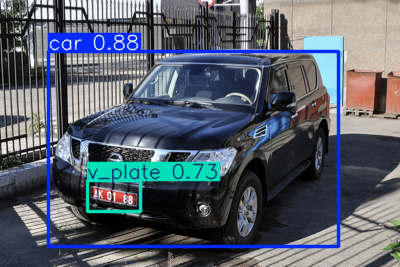

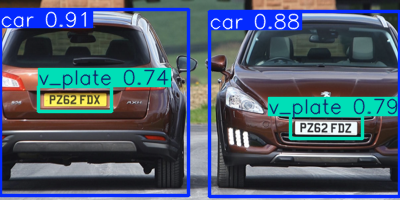

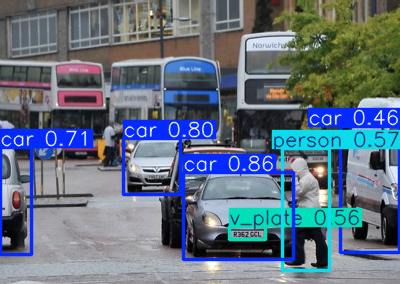

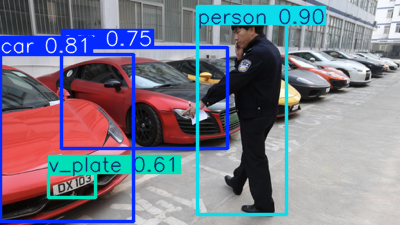

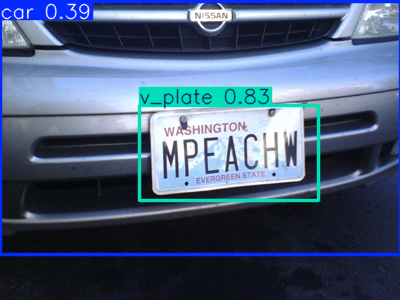

...

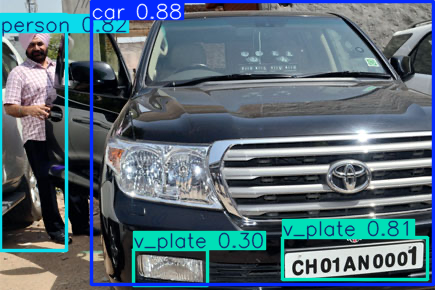

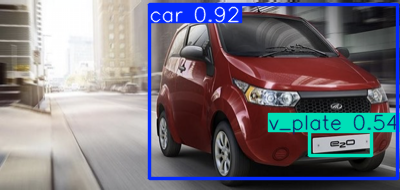

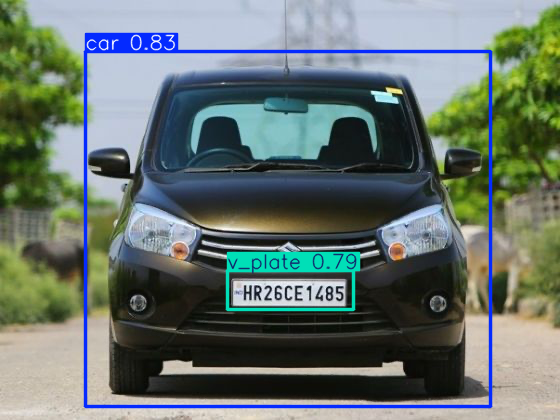

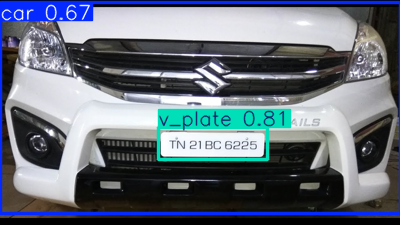

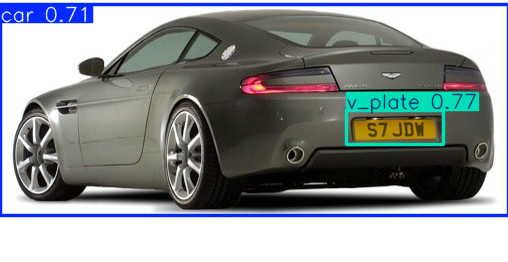

In [ ]:
image_files = glob.glob('runs/detect/predict/*.png')

for image_file in image_files:
  display(Image(filename=image_file))
  print("\n")

###Overly trained model

In [ ]:
best_model = YOLO("/content/drive/MyDrive/DEfDO_Project/runs/detect/train2/weights/best.pt")

tests = best_model('/content/drive/MyDrive/DEfDO_Project/testing', save=True)


image 1/18 /content/drive/MyDrive/DEfDO_Project/testing/Cars357.png: 448x640 1 car, 1 v_plate, 7.5ms
image 2/18 /content/drive/MyDrive/DEfDO_Project/testing/Cars358.png: 320x640 2 cars, 2 v_plates, 7.8ms
image 3/18 /content/drive/MyDrive/DEfDO_Project/testing/Cars359.png: 480x640 4 cars, 1 person, 1 v_plate, 17.1ms
image 4/18 /content/drive/MyDrive/DEfDO_Project/testing/Cars360.png: 384x640 2 cars, 1 person, 1 v_plate, 8.0ms
image 5/18 /content/drive/MyDrive/DEfDO_Project/testing/Cars361.png: 480x640 1 v_plate, 7.0ms
image 6/18 /content/drive/MyDrive/DEfDO_Project/testing/Cars362.png: 480x640 2 cars, 1 person, 1 v_plate, 6.4ms
image 7/18 /content/drive/MyDrive/DEfDO_Project/testing/Cars363.png: 448x640 1 car, 1 v_plate, 7.0ms
image 8/18 /content/drive/MyDrive/DEfDO_Project/testing/Cars364.png: 416x640 3 cars, 2 v_plates, 7.2ms
image 9/18 /content/drive/MyDrive/DEfDO_Project/testing/Cars365.png: 448x640 1 car, 1 v_plate, 10.8ms
image 10/18 /content/drive/MyDrive/DEfDO_Project/testing/C

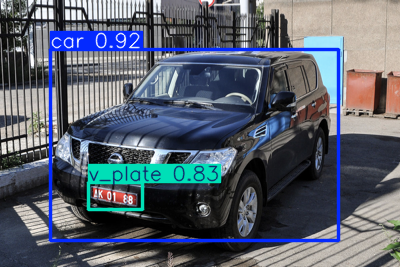

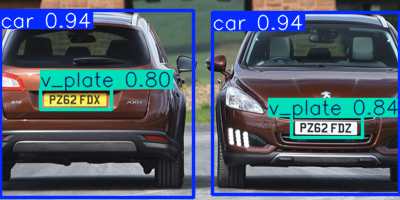

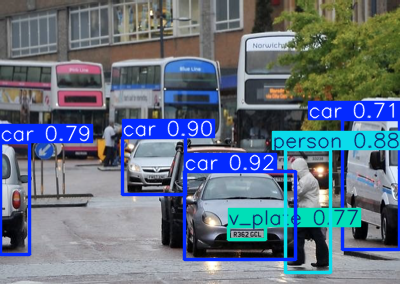

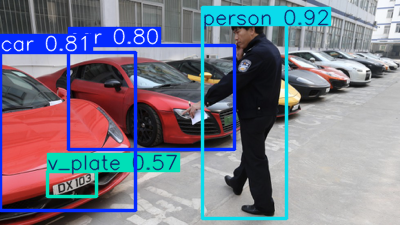

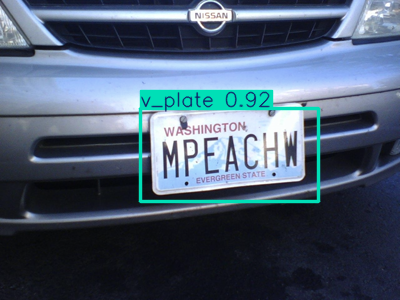

...

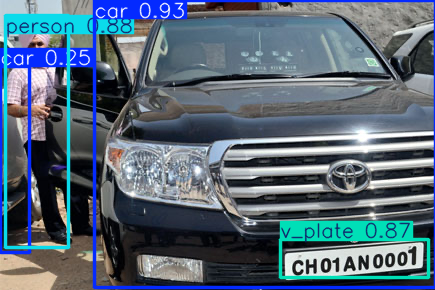

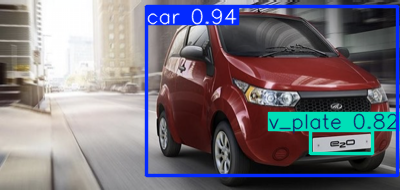

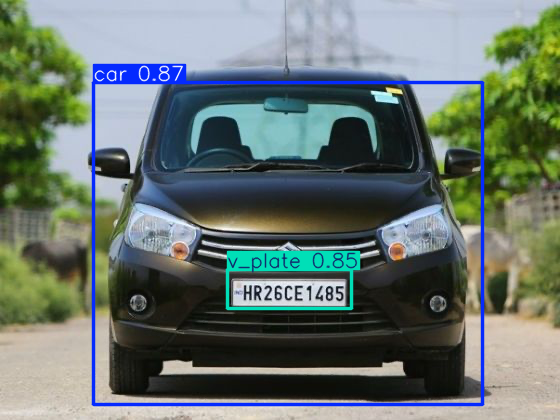

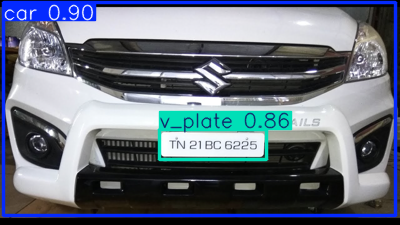

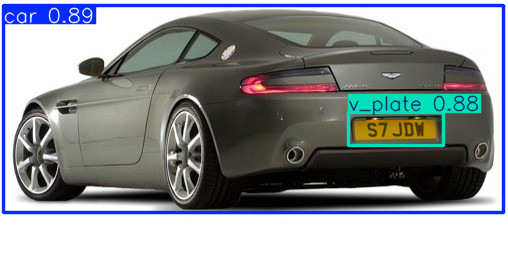

In [ ]:
image_files = glob.glob('runs/detect/predict2/*.png')

for image_file in image_files:
  display(Image(filename=image_file))
  print("\n")

We can see that a few extra epochs helped in removing false positives in our predictictions(images 6 and 13) and incremented the confidence scores for the model (almost in all images).

#Deployment Preparations

##Pruning

In [ ]:
import torch
from torch.nn.utils import prune

best_model = YOLO("/content/drive/MyDrive/DEfDO_Project/runs/detect/train2/weights/best.pt")


In [ ]:
# Making a copy of the best_model
from copy import deepcopy
pruned_model = deepcopy(best_model)

# Move the entire model to the desired device after pruning
device="cuda" if torch.cuda.is_available() else "cpu"
pruned_model.to(device)

YOLO(
  (model): DetectionModel(
    (model): Sequential(
      (0): Conv(
        (conv): Conv2d(3, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
        (bn): BatchNorm2d(16, eps=0.001, momentum=0.03, affine=True, track_running_stats=True)
        (act): SiLU(inplace=True)
      )
      (1): Conv(
        (conv): Conv2d(16, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
        (bn): BatchNorm2d(32, eps=0.001, momentum=0.03, affine=True, track_running_stats=True)
        (act): SiLU(inplace=True)
      )
      (2): C2f(
        (cv1): Conv(
          (conv): Conv2d(32, 32, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn): BatchNorm2d(32, eps=0.001, momentum=0.03, affine=True, track_running_stats=True)
          (act): SiLU(inplace=True)
        )
        (cv2): Conv(
          (conv): Conv2d(48, 32, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn): BatchNorm2d(32, eps=0.001, momentum=0.03, affine=True, track_running_s

In [ ]:
for name, module in pruned_model.named_modules():
  if isinstance(module, torch.nn.Conv2d):
      prune.l1_unstructured(module, name='weight', amount=0.3)

In [ ]:
for name, module in pruned_model.named_modules():
  if isinstance(module, torch.nn.Conv2d):
      module.weight

###Checking removed weights

In [ ]:
pruned_model = YOLO("/content/drive/MyDrive/DEfDO_Project/runs/detect/train4/weights/best_pruned.pt")


In [ ]:
# prompt: show number of weights of the YOLO model   best_model

total_params_best = sum(p.numel() for p in best_model.parameters())
print(f"Total number of parameters in best_model: {total_params_best}")

total_params_pruned_model = sum(p.numel() for p in pruned_model.parameters())
print(f"Total number of parameters in pruned_model: {total_params_pruned_model}")


Total number of parameters in best_model: 3011628
Total number of parameters in pruned_model: 3011628


In [ ]:
# Counting the number of weights equal to zero in the Yolo model pruned_model
import math

zero_weights = 0
for name, param in pruned_model.named_parameters():
    zero_weights += torch.sum(torch.abs(param) <= 1e-1).item()
print(f"Total number of zero weights in pruned_model: {zero_weights}")


Total number of zero weights in pruned_model: 2863970


In [ ]:
list(best_model.named_buffers())[1]

('model.model.0.bn.running_var',
 tensor([0.0251, 0.0245, 0.0242, 0.0307, 0.0015, 0.0224, 0.0014, 0.0525, 0.0359, 0.0070, 0.0113, 0.0033, 0.0031, 0.0267, 0.0217, 0.0065]))

In [ ]:
list(pruned_model.named_buffers())[1]


('model.model.0.bn.running_mean',
 tensor([-0.0115, -0.2820, -0.0026, -0.0210, -0.0182,  0.0066, -0.0054, -0.4243, -0.0194, -0.0073, -0.1919, -0.0102, -0.0046, -0.0184,  0.2639,  0.0173]))

###Evaluate

In [ ]:
# Validate the model
metrics = pruned_model.val(data='my_dataset_v2/my_dataYaml2.yaml')  # no arguments needed, dataset and settings remembered
metrics.box.map  # map50-95
metrics.box.map50  # map50
metrics.box.map75  # map75
metrics.box.maps  # a list contains map50-95 of each category

Model summary (fused): 168 layers, 3,006,428 parameters, 0 gradients, 8.1 GFLOPs


val: Scanning /content/drive/MyDrive/DEfDO_Project/my_dataset_v2/labels/val.cache... 131 images, 1 backgrounds, 0 corrupt: 100%|██████████| 131/131 [00:00<?, ?it/s]
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:09<00:00,  1.06s/it]


                   all        131        540      0.458      0.456      0.431      0.186
                   car         59         97      0.553      0.567      0.596      0.337
                person         87        326       0.48      0.429      0.436      0.163
        traffic lights         27         63      0.274      0.254      0.159     0.0636
               v_plate         45         54      0.524      0.574      0.532       0.18
Speed: 5.3ms preprocess, 8.3ms inference, 0.0ms loss, 8.3ms postprocess per image
Results saved to runs/detect/val16


array([    0.33682,     0.16313,    0.063633,     0.17996])

Given the observed decline in all metrics, we conclude that the model's accuracy has decreased. To compensate for this, I retrain the pruned model.

###Retrain

In [ ]:
pruned_results= pruned_model.train(data = 'my_dataset_v2/my_dataYaml2.yaml' , epochs = 100, imgsz = 640, batch = 8)

engine/trainer: task=detect, mode=train, model=/content/drive/MyDrive/DEfDO_Project/runs/detect/train2/weights/best.pt, data=my_dataset_v2/my_dataYaml2.yaml, epochs=100, time=None, patience=100, batch=8, imgsz=640, save=True, save_period=-1, cache=False, device=cuda:0, workers=8, project=None, name=train4, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, show_boxes=True, line_w

/usr/local/lib/python3.10/dist-packages/ultralytics/engine/trainer.py:268: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  self.scaler = torch.cuda.amp.GradScaler(enabled=self.amp)
train: Scanning /content/drive/MyDrive/DEfDO_Project/my_dataset_v2/labels/train.cache... 1821 images, 0 backgrounds, 3 corrupt: 100%|██████████| 1821/1821 [00:00<?, ?it/s]

train: WARNING ⚠️ /content/drive/MyDrive/DEfDO_Project/my_dataset_v2/images/train/Cars10_png.rf.8f1a4ca01e5ceae1801363998b028c55.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates [     1.1305]
train: WARNING ⚠️ /content/drive/MyDrive/DEfDO_Project/my_dataset_v2/images/train/Cars10_png.rf.a8224505e8fa8509682597af9e56595c.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates [     1.1705]
train: WARNING ⚠️ /content/drive/MyDrive/DEfDO_Project/my_dataset_v2/images/train/Cars10_png.rf.b5a541bc7723e1ae338bce034e6e39c5.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates [     1.1126]


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
val: Scanning /content/drive/MyDrive/DEfDO_Project/my_dataset_v2/labels/val.cache... 131 images, 1 backgrounds, 0 corrupt: 100%|██████████| 131/131 [00:00<?, ?it/s]


Plotting labels to runs/detect/train4/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.00125, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/train4
Starting training for 100 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/100      1.37G      2.996      2.508       2.87          9        640: 100%|██████████| 228/228 [12:16<00:00,  3.23s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.81it/s]

                   all        131        540      0.577      0.457      0.477      0.202



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/100      1.22G      1.936      1.603       1.94         12        640: 100%|██████████| 228/228 [01:01<00:00,  3.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  3.00it/s]


                   all        131        540      0.686      0.578      0.609      0.272

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/100      1.25G       1.63      1.291      1.592         18        640: 100%|██████████| 228/228 [01:00<00:00,  3.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.98it/s]


                   all        131        540      0.687      0.607      0.675      0.327

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/100      1.24G      1.521      1.171      1.482         15        640: 100%|██████████| 228/228 [01:01<00:00,  3.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.57it/s]

                   all        131        540      0.696      0.649      0.698       0.35



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/100       1.3G      1.454      1.075      1.399         42        640: 100%|██████████| 228/228 [01:02<00:00,  3.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.26it/s]

                   all        131        540      0.737      0.635      0.694      0.324



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/100      1.25G      1.385     0.9918      1.351          9        640: 100%|██████████| 228/228 [01:04<00:00,  3.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.88it/s]

                   all        131        540      0.747      0.677      0.728      0.371



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/100      1.25G       1.34     0.9628      1.314         15        640: 100%|██████████| 228/228 [01:05<00:00,  3.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.76it/s]

                   all        131        540      0.808      0.665      0.732      0.377



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/100      1.24G      1.297     0.9022      1.284         15        640: 100%|██████████| 228/228 [01:04<00:00,  3.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  6.64it/s]

                   all        131        540      0.738       0.65      0.717      0.344



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/100      1.24G      1.285     0.8853      1.267         14        640: 100%|██████████| 228/228 [01:02<00:00,  3.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.12it/s]

                   all        131        540      0.736      0.695      0.727      0.371



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/100      1.25G       1.25     0.8491      1.244         18        640: 100%|██████████| 228/228 [00:59<00:00,  3.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.05it/s]

                   all        131        540      0.702      0.701      0.717      0.345



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/100      1.24G      1.238     0.8257      1.235          7        640: 100%|██████████| 228/228 [00:59<00:00,  3.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  4.07it/s]

                   all        131        540      0.761      0.672      0.734      0.363



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/100      1.25G      1.222     0.8115      1.213         10        640: 100%|██████████| 228/228 [01:02<00:00,  3.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  6.22it/s]

                   all        131        540      0.795      0.685       0.74      0.374



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/100      1.25G       1.17     0.7822      1.198         24        640: 100%|██████████| 228/228 [01:02<00:00,  3.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.59it/s]

                   all        131        540      0.757      0.687      0.732       0.39



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/100      1.25G      1.176     0.7785      1.194         18        640: 100%|██████████| 228/228 [01:03<00:00,  3.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.99it/s]

                   all        131        540      0.756       0.68      0.735      0.376



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/100      1.24G      1.162     0.7601      1.184         22        640: 100%|██████████| 228/228 [01:02<00:00,  3.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  4.30it/s]

                   all        131        540      0.774      0.707      0.741      0.378



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/100      1.24G      1.153     0.7526      1.177         11        640: 100%|██████████| 228/228 [01:02<00:00,  3.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.23it/s]


                   all        131        540      0.758      0.681      0.729      0.376

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/100      1.24G      1.145     0.7482      1.169         15        640: 100%|██████████| 228/228 [01:00<00:00,  3.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.90it/s]


                   all        131        540      0.774      0.704      0.741       0.38

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/100      1.25G      1.137     0.7446      1.166         24        640: 100%|██████████| 228/228 [00:59<00:00,  3.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.48it/s]

                   all        131        540      0.777      0.663      0.718      0.368



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/100      1.24G      1.123     0.7229       1.15         16        640: 100%|██████████| 228/228 [00:59<00:00,  3.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.92it/s]

                   all        131        540       0.74      0.687      0.739       0.38



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/100      1.26G      1.113     0.7267      1.146         14        640: 100%|██████████| 228/228 [01:01<00:00,  3.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  4.47it/s]

                   all        131        540      0.769      0.688      0.731       0.36



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/100      1.25G      1.099      0.706      1.137         14        640: 100%|██████████| 228/228 [01:03<00:00,  3.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.81it/s]

                   all        131        540      0.777      0.683      0.727      0.369



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/100      1.28G      1.095      0.688      1.134         18        640: 100%|██████████| 228/228 [01:04<00:00,  3.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  6.22it/s]

                   all        131        540      0.778      0.676       0.73      0.373



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/100      1.25G       1.08     0.6905      1.127         11        640: 100%|██████████| 228/228 [01:04<00:00,  3.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  6.40it/s]

                   all        131        540      0.761      0.685       0.73      0.378



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/100      1.23G      1.094     0.6935      1.134         17        640: 100%|██████████| 228/228 [01:02<00:00,  3.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  4.42it/s]

                   all        131        540      0.813       0.63      0.732      0.374



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/100      1.24G      1.073     0.6823      1.118          7        640: 100%|██████████| 228/228 [01:00<00:00,  3.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.27it/s]

                   all        131        540      0.811      0.675      0.754      0.385



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/100      1.24G      1.065     0.6715      1.113         18        640: 100%|██████████| 228/228 [00:59<00:00,  3.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.29it/s]


                   all        131        540      0.775      0.701      0.749      0.382

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/100      1.24G      1.059     0.6697      1.122         19        640: 100%|██████████| 228/228 [01:00<00:00,  3.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.34it/s]

                   all        131        540      0.792      0.673      0.741      0.368



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/100      1.23G      1.059     0.6668      1.113         27        640: 100%|██████████| 228/228 [01:02<00:00,  3.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.77it/s]

                   all        131        540      0.726        0.7      0.743      0.393



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/100      1.23G      1.041     0.6595      1.103         24        640: 100%|██████████| 228/228 [01:03<00:00,  3.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.52it/s]

                   all        131        540      0.831      0.651      0.739      0.375



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/100      1.25G      1.041     0.6572        1.1         19        640: 100%|██████████| 228/228 [01:02<00:00,  3.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.38it/s]

                   all        131        540      0.742       0.71      0.736      0.383



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/100      1.25G      1.025     0.6486      1.097         16        640: 100%|██████████| 228/228 [01:01<00:00,  3.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.97it/s]

                   all        131        540      0.764      0.701      0.735      0.381



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/100      1.25G      1.042     0.6447      1.094         25        640: 100%|██████████| 228/228 [01:01<00:00,  3.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.33it/s]

                   all        131        540      0.817      0.645      0.732      0.386



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/100      1.28G       1.03     0.6473      1.091         14        640: 100%|██████████| 228/228 [00:59<00:00,  3.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.39it/s]

                   all        131        540      0.797      0.676      0.742      0.381



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/100      1.23G      1.013     0.6336      1.087         10        640: 100%|██████████| 228/228 [01:01<00:00,  3.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.48it/s]

                   all        131        540      0.747      0.736      0.761      0.393



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/100      1.23G      1.015     0.6308      1.085         10        640: 100%|██████████| 228/228 [01:02<00:00,  3.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.11it/s]

                   all        131        540      0.802      0.654      0.728       0.38



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/100      1.24G      1.022     0.6411      1.095         15        640: 100%|██████████| 228/228 [01:04<00:00,  3.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  6.32it/s]

                   all        131        540      0.808      0.671      0.737      0.378



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/100      1.23G      1.006      0.624      1.083         12        640: 100%|██████████| 228/228 [01:03<00:00,  3.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.50it/s]

                   all        131        540      0.789      0.681      0.735      0.384



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/100      1.23G     0.9909     0.6104      1.071          7        640: 100%|██████████| 228/228 [01:03<00:00,  3.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.62it/s]

                   all        131        540      0.747      0.696      0.743      0.393



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/100      1.23G     0.9969     0.6214      1.077          8        640: 100%|██████████| 228/228 [01:00<00:00,  3.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.01it/s]


                   all        131        540      0.807      0.672      0.741      0.387

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/100      1.23G     0.9934     0.6147      1.072         29        640: 100%|██████████| 228/228 [00:59<00:00,  3.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.20it/s]

                   all        131        540      0.804      0.701      0.749      0.389



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/100      1.25G     0.9958     0.6145      1.071         18        640: 100%|██████████| 228/228 [01:00<00:00,  3.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  4.00it/s]

                   all        131        540      0.804      0.661      0.736      0.387



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/100      1.26G     0.9871     0.6168      1.075          7        640: 100%|██████████| 228/228 [01:02<00:00,  3.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.54it/s]

                   all        131        540      0.812      0.688      0.749      0.389



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/100      1.24G     0.9766     0.6079      1.071         15        640: 100%|██████████| 228/228 [01:01<00:00,  3.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  6.17it/s]

                   all        131        540      0.809      0.691      0.756      0.391



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/100      1.25G     0.9768     0.6003      1.063         10        640: 100%|██████████| 228/228 [01:03<00:00,  3.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.89it/s]

                   all        131        540      0.793      0.672      0.748      0.384



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/100      1.24G     0.9659     0.5948       1.06         16        640: 100%|██████████| 228/228 [01:02<00:00,  3.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.89it/s]

                   all        131        540      0.802       0.67      0.751      0.388



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/100      1.24G     0.9863     0.6103       1.07         16        640: 100%|██████████| 228/228 [01:03<00:00,  3.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.39it/s]

                   all        131        540      0.809      0.693      0.755      0.392



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/100      1.23G     0.9538      0.591      1.063         38        640: 100%|██████████| 228/228 [01:01<00:00,  3.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.86it/s]


                   all        131        540      0.817      0.696      0.752      0.386

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/100      1.24G     0.9688     0.6004      1.059          6        640: 100%|██████████| 228/228 [01:01<00:00,  3.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.91it/s]


                   all        131        540        0.8      0.678      0.735      0.387

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/100      1.24G     0.9674     0.5931      1.058         18        640: 100%|██████████| 228/228 [01:00<00:00,  3.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.19it/s]

                   all        131        540      0.757      0.718      0.757      0.391



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/100      1.25G     0.9579     0.5876       1.06         31        640: 100%|██████████| 228/228 [01:03<00:00,  3.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.69it/s]

                   all        131        540      0.758      0.698      0.742       0.39



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/100      1.24G     0.9434      0.576       1.05         22        640: 100%|██████████| 228/228 [01:03<00:00,  3.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.49it/s]

                   all        131        540      0.764      0.708      0.757      0.386



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/100      1.23G     0.9694     0.5981      1.061         12        640: 100%|██████████| 228/228 [01:05<00:00,  3.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  4.93it/s]

                   all        131        540      0.803      0.652      0.746       0.39



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/100      1.23G     0.9473     0.5828      1.047         13        640: 100%|██████████| 228/228 [01:03<00:00,  3.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.91it/s]

                   all        131        540      0.803       0.68      0.756       0.39



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/100      1.23G     0.9422     0.5854       1.05          5        640: 100%|██████████| 228/228 [01:00<00:00,  3.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.87it/s]

                   all        131        540      0.812      0.647      0.741      0.388



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/100      1.24G     0.9425     0.5799      1.053         16        640: 100%|██████████| 228/228 [01:01<00:00,  3.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.27it/s]

                   all        131        540      0.837      0.669      0.755      0.401



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/100      1.25G     0.9321     0.5712      1.043         19        640: 100%|██████████| 228/228 [01:05<00:00,  3.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.64it/s]

                   all        131        540      0.849       0.67      0.753       0.39



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/100      1.23G     0.9201     0.5666      1.034          4        640: 100%|██████████| 228/228 [01:04<00:00,  3.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.79it/s]

                   all        131        540      0.831      0.654      0.742      0.393



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/100      1.24G     0.9288     0.5689      1.042         20        640: 100%|██████████| 228/228 [01:05<00:00,  3.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  6.23it/s]

                   all        131        540      0.841      0.664      0.755      0.394



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/100      1.25G     0.9214     0.5652      1.042         20        640: 100%|██████████| 228/228 [01:04<00:00,  3.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.71it/s]

                   all        131        540      0.828      0.686      0.753      0.387



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/100      1.24G     0.9206     0.5678      1.043         14        640: 100%|██████████| 228/228 [01:02<00:00,  3.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.94it/s]

                   all        131        540      0.781      0.709      0.757      0.392



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/100      1.23G     0.9243     0.5611      1.035         12        640: 100%|██████████| 228/228 [01:02<00:00,  3.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.11it/s]


                   all        131        540      0.792      0.714      0.763      0.402

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/100      1.25G     0.9071     0.5539      1.034         19        640: 100%|██████████| 228/228 [01:00<00:00,  3.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.53it/s]


                   all        131        540      0.763      0.715      0.752      0.385

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/100      1.19G     0.9272     0.5617      1.038         69        640:  37%|███▋      | 85/228 [00:23<00:47,  2.98it/s]

I renamed train4 to train3

In [ ]:
pruned_model = YOLO("/content/drive/MyDrive/DEfDO_Project/runs/detect/train3/weights/last.pt")
pruned_model.train(resume = True)

Ultralytics YOLOv8.2.84 🚀 Python-3.10.12 torch-2.4.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=/content/drive/MyDrive/DEfDO_Project/runs/detect/train3/weights/last.pt, data=my_dataset_v2/my_dataYaml2.yaml, epochs=100, time=None, patience=100, batch=8, imgsz=640, save=True, save_period=-1, cache=False, device=cuda:0, workers=8, project=None, name=train4, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=/content/drive/MyDrive/DEfDO_Project/runs/detect/train3/weights/last.pt, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=Fals

100%|██████████| 755k/755k [00:00<00:00, 104MB/s]

TensorBoard: Start with 'tensorboard --logdir runs/detect/train4', view at http://localhost:6006/



                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      7360  ultralytics.nn.modules.block.C2f             [32, 32, 1, True]             
  3                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  4                  -1  2     49664  ultralytics.nn.modules.block.C2f             [64, 64, 2, True]             
  5                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  6                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  7                  -1  1    295424  ultralytics.nn.modules.conv.Conv             [128

/usr/local/lib/python3.10/dist-packages/ultralytics/engine/trainer.py:268: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  self.scaler = torch.cuda.amp.GradScaler(enabled=self.amp)
train: Scanning /content/drive/.shortcut-targets-by-id/1TkpDLbwdz9cnlAoSOxTWOJRjsRCf2QN8/DEfDO_Project/my_dataset_v2/labels/train... 1821 images, 0 backgrounds, 3 corrupt: 100%|██████████| 1821/1821 [23:46<00:00,  1.28it/s]

train: WARNING ⚠️ /content/drive/.shortcut-targets-by-id/1TkpDLbwdz9cnlAoSOxTWOJRjsRCf2QN8/DEfDO_Project/my_dataset_v2/images/train/Cars10_png.rf.8f1a4ca01e5ceae1801363998b028c55.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates [     1.1305]
train: WARNING ⚠️ /content/drive/.shortcut-targets-by-id/1TkpDLbwdz9cnlAoSOxTWOJRjsRCf2QN8/DEfDO_Project/my_dataset_v2/images/train/Cars10_png.rf.a8224505e8fa8509682597af9e56595c.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates [     1.1705]
train: WARNING ⚠️ /content/drive/.shortcut-targets-by-id/1TkpDLbwdz9cnlAoSOxTWOJRjsRCf2QN8/DEfDO_Project/my_dataset_v2/images/train/Cars10_png.rf.b5a541bc7723e1ae338bce034e6e39c5.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates [     1.1126]


train: New cache created: /content/drive/.shortcut-targets-by-id/1TkpDLbwdz9cnlAoSOxTWOJRjsRCf2QN8/DEfDO_Project/my_dataset_v2/labels/train.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
val: Scanning /content/drive/.shortcut-targets-by-id/1TkpDLbwdz9cnlAoSOxTWOJRjsRCf2QN8/DEfDO_Project/my_dataset_v2/labels/val... 131 images, 1 backgrounds, 0 corrupt: 100%|██████████| 131/131 [01:37<00:00,  1.34it/s]

val: New cache created: /content/drive/.shortcut-targets-by-id/1TkpDLbwdz9cnlAoSOxTWOJRjsRCf2QN8/DEfDO_Project/my_dataset_v2/labels/val.cache


Plotting labels to runs/detect/train4/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.00125, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Resuming training /content/drive/MyDrive/DEfDO_Project/runs/detect/train3/weights/last.pt from epoch 63 to 100 total epochs
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/train4
Starting training for 100 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/100      1.22G      0.908     0.5492      1.029          9        640: 100%|██████████| 228/228 [01:02<00:00,  3.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.96it/s]

                   all        131        540      0.781      0.681       0.74      0.388



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     64/100      1.19G     0.8971     0.5488      1.027         12        640: 100%|██████████| 228/228 [01:00<00:00,  3.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.27it/s]

                   all        131        540      0.839      0.646      0.745      0.396



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     65/100      1.24G     0.8851     0.5376       1.02         18        640: 100%|██████████| 228/228 [01:01<00:00,  3.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.40it/s]

                   all        131        540       0.79      0.688       0.74      0.388



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/100      1.19G     0.8925     0.5433      1.028         15        640: 100%|██████████| 228/228 [01:03<00:00,  3.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.26it/s]

                   all        131        540      0.839      0.694      0.759      0.397



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     67/100      1.24G     0.8826     0.5403      1.018         42        640: 100%|██████████| 228/228 [01:03<00:00,  3.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.82it/s]


                   all        131        540       0.81      0.684      0.747      0.387

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     68/100      1.24G     0.8695     0.5312      1.017          9        640: 100%|██████████| 228/228 [01:00<00:00,  3.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.72it/s]

                   all        131        540      0.814      0.694       0.75      0.395



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     69/100      1.24G      0.865     0.5303      1.013         15        640: 100%|██████████| 228/228 [01:00<00:00,  3.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  4.02it/s]

                   all        131        540      0.821       0.68      0.749      0.394



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     70/100      1.19G     0.8616     0.5262      1.012         15        640: 100%|██████████| 228/228 [01:01<00:00,  3.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.18it/s]

                   all        131        540      0.802      0.706      0.752      0.392



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     71/100      1.22G     0.8666      0.532      1.015         14        640: 100%|██████████| 228/228 [01:00<00:00,  3.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.34it/s]

                   all        131        540      0.824      0.666      0.754      0.392



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     72/100      1.24G     0.8535     0.5173      1.006         18        640: 100%|██████████| 228/228 [01:01<00:00,  3.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.15it/s]

                   all        131        540       0.82      0.678      0.745      0.389



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     73/100      1.19G     0.8535      0.518      1.009          7        640: 100%|██████████| 228/228 [01:03<00:00,  3.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.31it/s]

                   all        131        540      0.796      0.676      0.749      0.394



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     74/100      1.24G     0.8508      0.518      1.001         10        640: 100%|██████████| 228/228 [01:01<00:00,  3.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  4.31it/s]

                   all        131        540      0.745      0.708       0.75      0.395



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     75/100      1.24G     0.8278     0.5068      1.002         24        640: 100%|██████████| 228/228 [01:01<00:00,  3.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  4.24it/s]

                   all        131        540      0.765      0.709      0.755      0.388



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     76/100      1.24G       0.84     0.5141      1.002         18        640: 100%|██████████| 228/228 [00:59<00:00,  3.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.04it/s]

                   all        131        540      0.815      0.703      0.753      0.401



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     77/100      1.18G     0.8346     0.5085      1.003         22        640: 100%|██████████| 228/228 [01:00<00:00,  3.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.55it/s]

                   all        131        540      0.841      0.689      0.757      0.398



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     78/100      1.23G     0.8341     0.5083      1.001         11        640: 100%|██████████| 228/228 [01:03<00:00,  3.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.25it/s]

                   all        131        540      0.823      0.701      0.764        0.4



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     79/100      1.22G     0.8369     0.5115      1.002         15        640: 100%|██████████| 228/228 [01:01<00:00,  3.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  4.95it/s]

                   all        131        540      0.807      0.691      0.749       0.39



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     80/100      1.24G     0.8247     0.5113      1.002         24        640: 100%|██████████| 228/228 [01:03<00:00,  3.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.76it/s]

                   all        131        540       0.83       0.68       0.76      0.406



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     81/100      1.22G     0.8244      0.502     0.9944         16        640: 100%|██████████| 228/228 [01:01<00:00,  3.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  4.93it/s]

                   all        131        540      0.799      0.716      0.759      0.398



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     82/100      1.25G     0.8217     0.5047     0.9934         14        640: 100%|██████████| 228/228 [01:02<00:00,  3.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.97it/s]

                   all        131        540      0.818      0.699      0.756      0.394



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     83/100      1.24G     0.8139     0.4996     0.9922         14        640: 100%|██████████| 228/228 [01:04<00:00,  3.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.29it/s]

                   all        131        540      0.831      0.701      0.757      0.395



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     84/100      1.23G     0.8106     0.4916      0.991         18        640: 100%|██████████| 228/228 [01:02<00:00,  3.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.39it/s]

                   all        131        540      0.807       0.69      0.752       0.39



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     85/100      1.24G     0.8048     0.4972      0.988         11        640: 100%|██████████| 228/228 [01:03<00:00,  3.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.40it/s]

                   all        131        540      0.766      0.714      0.745      0.395



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     86/100      1.22G     0.8129     0.4939     0.9895         17        640: 100%|██████████| 228/228 [01:01<00:00,  3.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.47it/s]

                   all        131        540      0.788      0.717      0.757      0.393



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     87/100      1.22G     0.7995     0.4887     0.9846          7        640: 100%|██████████| 228/228 [01:01<00:00,  3.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.49it/s]

                   all        131        540      0.834      0.693      0.768      0.398



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     88/100      1.18G     0.8021     0.4894     0.9824         18        640: 100%|██████████| 228/228 [01:03<00:00,  3.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  4.67it/s]

                   all        131        540      0.817      0.701      0.756      0.397



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     89/100      1.22G      0.797     0.4854     0.9926         19        640: 100%|██████████| 228/228 [01:01<00:00,  3.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.12it/s]

                   all        131        540      0.812      0.702       0.76      0.397



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     90/100      1.18G     0.8024     0.4917     0.9873         27        640: 100%|██████████| 228/228 [01:02<00:00,  3.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.11it/s]


                   all        131        540       0.84      0.675      0.763      0.402
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     91/100      1.22G     0.7644     0.4231     0.9469          3        640: 100%|██████████| 228/228 [00:56<00:00,  4.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  4.42it/s]

                   all        131        540      0.758      0.707      0.746      0.394



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     92/100      1.22G     0.7371     0.4014     0.9332         14        640: 100%|██████████| 228/228 [00:56<00:00,  4.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  4.59it/s]

                   all        131        540      0.807      0.667      0.747      0.397



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     93/100      1.22G      0.724     0.3986     0.9301          6        640: 100%|██████████| 228/228 [00:55<00:00,  4.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  4.26it/s]

                   all        131        540      0.834      0.669      0.762      0.399



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     94/100      1.22G     0.7245     0.3979     0.9281         13        640: 100%|██████████| 228/228 [00:55<00:00,  4.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.91it/s]

                   all        131        540      0.804      0.703      0.763      0.403



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     95/100      1.22G     0.7211     0.3959     0.9253         11        640: 100%|██████████| 228/228 [00:56<00:00,  4.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.89it/s]

                   all        131        540      0.798      0.701      0.762        0.4



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     96/100      1.22G     0.7137     0.3928     0.9245          8        640: 100%|██████████| 228/228 [00:56<00:00,  4.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  6.37it/s]

                   all        131        540       0.83      0.681      0.769      0.406



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     97/100      1.22G     0.7165     0.3936     0.9271          9        640: 100%|██████████| 228/228 [00:54<00:00,  4.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.67it/s]

                   all        131        540      0.821      0.688      0.767      0.402



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     98/100      1.22G     0.7005     0.3839      0.921          3        640: 100%|██████████| 228/228 [00:55<00:00,  4.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.72it/s]

                   all        131        540      0.838       0.68      0.769      0.407



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     99/100      1.22G     0.6946     0.3794     0.9176          3        640: 100%|██████████| 228/228 [00:56<00:00,  4.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.65it/s]

                   all        131        540      0.844      0.675      0.769      0.408



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    100/100      1.22G     0.7036     0.3893      0.922          4        640: 100%|██████████| 228/228 [00:55<00:00,  4.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  6.35it/s]

                   all        131        540      0.805      0.679      0.757      0.401



38 epochs completed in 0.669 hours.
Optimizer stripped from runs/detect/train4/weights/last.pt, 6.2MB
Optimizer stripped from runs/detect/train4/weights/best.pt, 6.2MB

Validating runs/detect/train4/weights/best.pt...
Ultralytics YOLOv8.2.84 🚀 Python-3.10.12 torch-2.4.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 3,006,428 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:05<00:00,  1.71it/s]


                   all        131        540      0.844      0.674      0.769      0.408
                   car         59         97      0.797      0.722      0.787      0.524
                person         87        326      0.835      0.669      0.777      0.378
        traffic lights         27         63      0.863      0.492       0.62      0.266
               v_plate         45         54       0.88      0.815      0.892      0.463
Speed: 0.8ms preprocess, 4.8ms inference, 0.0ms loss, 4.9ms postprocess per image
Results saved to runs/detect/train4


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1, 2, 3])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7f76f92256f0>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          0

###Renaming the model

In [ ]:

os.rename( './runs/detect/train4/weights/pruned_trained_model.pt', './runs/detect/train4/weights/best_pruned.pt')


###Pruning Conclusion

After applying pruning and retraining the model (best_pruned.pt), we observed a slight performance decrease compared to the original unpruned model (best_model.pt). Interestingly, the size of the pruned model after retraining became similar to the original model. Since the original model performed better and has a similar size, we will continue using best_model.pt for now.

##Quantization

In [5]:
best_model = YOLO('/content/drive/MyDrive/DEfDO_Project/runs/detect/train2/weights/best.pt')

In [7]:
best_model.export(format='tflite', int8=True, data='/content/drive/MyDrive/DEfDO_Project/my_dataset_v2/my_dataYaml2.yaml')

Ultralytics YOLOv8.2.89 🚀 Python-3.10.12 torch-2.4.0+cu121 CPU (Intel Xeon 2.00GHz)
Model summary (fused): 168 layers, 3,006,428 parameters, 0 gradients, 8.1 GFLOPs

PyTorch: starting from '/content/drive/MyDrive/DEfDO_Project/runs/detect/train2/weights/best.pt' with input shape (1, 3, 640, 640) BCHW and output shape(s) (1, 8, 8400) (5.9 MB)
requirements: Ultralytics requirements ['sng4onnx>=1.0.1', 'onnx_graphsurgeon>=0.3.26', 'onnx>=1.12.0', 'onnx2tf>1.17.5,<=1.22.3', 'onnxslim>=0.1.31', 'tflite_support', 'onnxruntime'] not found, attempting AutoUpdate...
Looking in indexes: https://pypi.org/simple, https://pypi.ngc.nvidia.com
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 136.6/136.6 kB 49.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.4/56.4 kB 174.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 15.9/15.9 MB 291.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 435.0/435.0 kB 306.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━

100%|██████████| 1.11M/1.11M [00:00<00:00, 69.1MB/s]
Unzipping calibration_image_sample_data_20x128x128x3_float32.npy.zip to /content/calibration_image_sample_data_20x128x128x3_float32.npy...: 100%|██████████| 1/1 [00:00<00:00, 49.84file/s]


ONNX: starting export with onnx 1.16.2 opset 19...


ONNX: slimming with onnxslim 0.1.33...
ONNX: export success ✅ 3.8s, saved as '/content/drive/MyDrive/DEfDO_Project/runs/detect/train2/weights/best.onnx' (11.8 MB)
TensorFlow SavedModel: collecting INT8 calibration images from 'data=/content/drive/MyDrive/DEfDO_Project/my_dataset_v2/my_dataYaml2.yaml'


100%|██████████| 755k/755k [00:00<00:00, 119MB/s]
Scanning /content/drive/.shortcut-targets-by-id/1TkpDLbwdz9cnlAoSOxTWOJRjsRCf2QN8/DEfDO_Project/my_dataset_v2/labels/val.cache... 131 images, 1 backgrounds, 0 corrupt: 100%|██████████| 131/131 [00:00<?, ?it/s]

TensorFlow SavedModel: WARNING ⚠️ >300 images recommended for INT8 calibration, found 131 images.


TensorFlow SavedModel: starting TFLite export with onnx2tf 1.22.3...

Automatic generation of each OP name started ========================================
Automatic generation of each OP name complete!

Model loaded ========================================================================

Model conversion started ============================================================
saved_model output started ==========================================================
saved_model output complete!
Float32 tflite output complete!
Float16 tflite output complete!
Dynamic Range Quantization tflite output complete!
Input signature information for quantization
signature_name: serving_default
input_name.0: images shape: (1, 640, 640, 3) dtype: <dtype: 'float32'>
INT8 Quantization tflite output complete!
Full INT8 Quantization tflite output complete!
INT8 Quantization with int16 activations tflite output complete!
Full INT8 Quantization with int16 activations tflite output complete!
TensorFlow SavedModel

'/content/drive/MyDrive/DEfDO_Project/runs/detect/train2/weights/best_saved_model/best_int8.tflite'